In [0]:
df = spark.read.csv("/FileStore/tables/diabetic_data.csv", header=True, inferSchema=True)
df.show()



+------------+-----------+---------------+------+--------+------+-----------------+------------------------+-------------------+----------------+----------+--------------------+------------------+--------------+---------------+-----------------+----------------+----------------+------+------+------+----------------+-------------+---------+---------+-----------+-----------+--------------+-----------+-------------+---------+---------+-----------+------------+-------------+--------+--------+------------+----------+-------+-----------+-------+-------------------+-------------------+------------------------+-----------------------+----------------------+------+-----------+----------+
|encounter_id|patient_nbr|           race|gender|     age|weight|admission_type_id|discharge_disposition_id|admission_source_id|time_in_hospital|payer_code|   medical_specialty|num_lab_procedures|num_procedures|num_medications|number_outpatient|number_emergency|number_inpatient|diag_1|diag_2|diag_3|number_diagn

In [0]:
from pyspark.sql.functions import to_date, col

# Load diabetic_data.csv from FileStore
diabetic_df = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .load("/FileStore/tables/diabetic_data.csv")

# Load IDS_mapping.csv from FileStore
ids_mapping_df = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .load("/FileStore/tables/IDS_mapping.csv")

# Preview schema and sample
diabetic_df.printSchema()
diabetic_df.show(5)

# Data Cleansing
clean_df = diabetic_df.dropna(subset=["patient_nbr"]) \
    .withColumnRenamed("patient_nbr", "patient_id") \
    .withColumn("admission_date", to_date(col("admission_type_id").cast("string")))  # Placeholder

# Optional join (uncomment if applicable)
# clean_df = clean_df.join(ids_mapping_df, clean_df["admission_type_id"] == ids_mapping_df["admission_type_id"], "left")

# Write to Delta Lake format in Databricks FileStore or DBFS
clean_df.write.format("delta").mode("overwrite").save("/tmp/cleaned_patient_records_delta")


root
 |-- encounter_id: integer (nullable = true)
 |-- patient_nbr: integer (nullable = true)
 |-- race: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: string (nullable = true)
 |-- weight: string (nullable = true)
 |-- admission_type_id: integer (nullable = true)
 |-- discharge_disposition_id: integer (nullable = true)
 |-- admission_source_id: integer (nullable = true)
 |-- time_in_hospital: integer (nullable = true)
 |-- payer_code: string (nullable = true)
 |-- medical_specialty: string (nullable = true)
 |-- num_lab_procedures: integer (nullable = true)
 |-- num_procedures: integer (nullable = true)
 |-- num_medications: integer (nullable = true)
 |-- number_outpatient: integer (nullable = true)
 |-- number_emergency: integer (nullable = true)
 |-- number_inpatient: integer (nullable = true)
 |-- diag_1: string (nullable = true)
 |-- diag_2: string (nullable = true)
 |-- diag_3: string (nullable = true)
 |-- number_diagnoses: integer (nullable = true)
 |-

In [0]:
df = spark.read.format("delta").load("/tmp/cleaned_patient_records_delta")
df.show()


+------------+----------+---------------+------+--------+------+-----------------+------------------------+-------------------+----------------+----------+--------------------+------------------+--------------+---------------+-----------------+----------------+----------------+------+------+------+----------------+-------------+---------+---------+-----------+-----------+--------------+-----------+-------------+---------+---------+-----------+------------+-------------+--------+--------+------------+----------+-------+-----------+-------+-------------------+-------------------+------------------------+-----------------------+----------------------+------+-----------+----------+--------------+
|encounter_id|patient_id|           race|gender|     age|weight|admission_type_id|discharge_disposition_id|admission_source_id|time_in_hospital|payer_code|   medical_specialty|num_lab_procedures|num_procedures|num_medications|number_outpatient|number_emergency|number_inpatient|diag_1|diag_2|diag_3

In [0]:
spark.sql("DROP TABLE IF EXISTS cleaned_patient_records")
spark.sql("""
    CREATE TABLE cleaned_patient_records
    USING DELTA
    LOCATION '/tmp/cleaned_patient_records_delta'
""")


Out[4]: DataFrame[]

In [0]:
%sql
SELECT * FROM cleaned_patient_records LIMIT 10


encounter_id,patient_id,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_date
2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,null
149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,null
64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,null
500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,null
16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,?,?,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30,null
55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,?,?,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,?,?,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30,null
12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,?,?,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
15738,63555939,Caucasian,Female,[90-100),?,3,3,4,12,?,InternalMedicine,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null


3. Data Warehousing & Governance (Snowflake)
A. Loading Data from Delta Lake to Snowflake
Configure Snowflake Connector:

In your Databricks notebook, install and configure the Snowflake connector.

Load Data

In [0]:
# Example: Write from Databricks to Snowflake
options = {
    "sfUrl": "wu85181.central-india.azure.snowflakecomputing.com",
    "sfUser": "justinjenish",
    "sfPassword": "b3AsTih2dShbUMx",
    "sfDatabase": "HEALTH_DB",
    "sfSchema": "PUBLIC",
    "sfWarehouse": "COMPUTE_WH"
}


In [0]:
clean_df.write.format("snowflake") \
    .options(**options) \
    .option("dbtable", "PATIENT_RECORDS") \
    .mode("overwrite") \
    .save()

### 4. Machine Learning Pipeline (Spark MLlib + MLflow)
A. Data Preparation
Extract Features:

Engineer features such as prior admissions, length of stay, comorbidities, etc.

Split Data:

Split your data into training and test sets using Spark’s randomSplit.

B. Model Development with Spark MLlib
Train a Model:

python
Copy


In [0]:
feature_cols = [
    "time_in_hospital",
    "number_outpatient",
    "number_emergency",
    "number_inpatient",
    "number_diagnoses",
    "num_medications"
]


In [0]:
from pyspark.sql.functions import when

# Create a binary label column
df_ml = clean_df.withColumn(
    "readmission_flag",
    when(clean_df["readmitted"] == "NO", 0).otherwise(1)
)


In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator

assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")
df_final = assembler.transform(df_ml).select("features", "readmission_flag")

# Train-test split
train, test = df_final.randomSplit([0.8, 0.2], seed=42)

# Train model
lr = LogisticRegression(featuresCol="features", labelCol="readmission_flag")
model = lr.fit(train)

# Predict and evaluate
predictions = model.transform(test)
evaluator = BinaryClassificationEvaluator(labelCol="readmission_flag")
accuracy = evaluator.evaluate(predictions)

print(f"Model accuracy: {accuracy}")


Model accuracy: 0.6490549859367641


In [0]:
import mlflow
import mlflow.spark

# End previous run if still active
if mlflow.active_run():
    mlflow.end_run()

mlflow.start_run()

mlflow.log_param("model_type", "LogisticRegression")
mlflow.log_metric("accuracy", accuracy)
mlflow.spark.log_model(model, "readmission_model")

mlflow.end_run()


2025/03/28 22:08:14 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/03/28 22:08:36 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/2618286953632219/6f43e6975c634100b3f322534e56af31/artifacts/readmission_model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 


# 5. Visualization & Reporting 

In [0]:
# Assuming 'age' and 'readmitted' columns exist
clean_df.groupBy("age", "readmitted").count().orderBy("age").display()


age,readmitted,count
[0-10),>30,26
[0-10),NO,132
[0-10),<30,3
[10-20),>30,224
[10-20),<30,40
[10-20),NO,427
[20-30),NO,911
[20-30),>30,510
[20-30),<30,236
[30-40),>30,1187


In [0]:
from pyspark.sql.functions import avg

clean_df.groupBy("admission_type_id") \
    .agg(avg("time_in_hospital").alias("avg_LOS")) \
    .orderBy("admission_type_id") \
    .display()


admission_type_id,avg_LOS
1,4.378273754398963
2,4.610714285714286
3,4.320472733054216
4,3.2
5,3.947126436781609
6,4.583065583065583
7,4.857142857142857
8,3.0625


In [0]:
clean_df.groupBy("readmitted").count().display()


readmitted,count
>30,35545
NO,54864
<30,11357


In [0]:
clean_df.select("patient_id", "age", "gender", "time_in_hospital", "readmitted").display()


patient_id,age,gender,time_in_hospital,readmitted
8222157,[0-10),Female,1,NO
55629189,[10-20),Female,3,>30
86047875,[20-30),Female,2,NO
82442376,[30-40),Male,2,NO
42519267,[40-50),Male,1,NO
82637451,[50-60),Male,3,>30
84259809,[60-70),Male,4,NO
114882984,[70-80),Male,5,>30
48330783,[80-90),Female,13,NO
63555939,[90-100),Female,12,NO


In [0]:
# After model prediction
predictions.groupBy("readmission_flag", "prediction").count().orderBy("readmission_flag", "prediction").display()


readmission_flag,prediction,count
0,0.0,8749
0,1.0,2160
1,0.0,5542
1,1.0,3750


In [0]:
dbutils.widgets.dropdown("readmitted", "ALL", ["ALL", "NO", "<30", ">30"])

filtered_df = clean_df if dbutils.widgets.get("readmitted") == "ALL" else clean_df.filter(col("readmitted") == dbutils.widgets.get("readmitted"))
filtered_df.display()


encounter_id,patient_id,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_date
2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,null
149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,null
64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,null
500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,null
16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,?,?,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30,null
55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,?,?,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,?,?,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30,null
12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,?,?,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null
15738,63555939,Caucasian,Female,[90-100),?,3,3,4,12,?,InternalMedicine,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,null


In [0]:
pdf = clean_df.select("age", "readmitted", "time_in_hospital").toPandas()

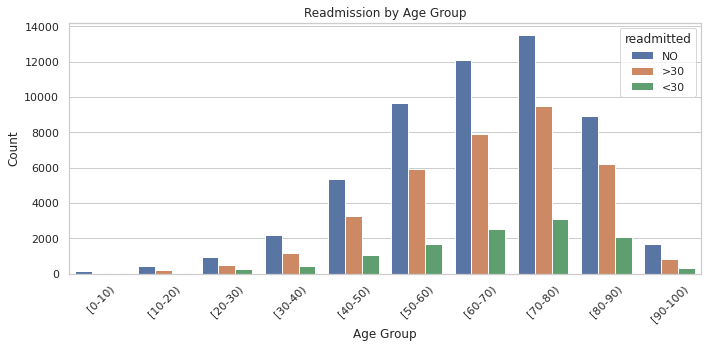

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")
plt.figure(figsize=(10, 5))

sns.countplot(data=pdf, x="age", hue="readmitted", order=sorted(pdf["age"].unique()))
plt.title("Readmission by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [0]:
import plotly.express as px

fig = px.histogram(pdf, x="age", color="readmitted", barmode="group",
                   title="Readmission by Age Group (Interactive)",
                   labels={"age": "Age Group", "readmitted": "Readmitted"})
fig.show()


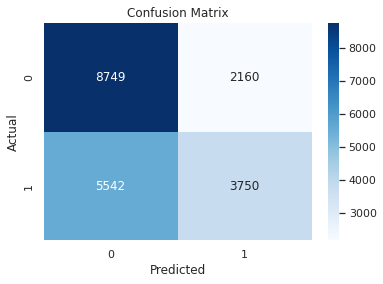

In [0]:
from sklearn.metrics import confusion_matrix
import pandas as pd

preds_pdf = predictions.select("readmission_flag", "prediction").toPandas()
conf = confusion_matrix(preds_pdf["readmission_flag"], preds_pdf["prediction"])

sns.heatmap(conf, annot=True, fmt='d', cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()
